wlsubj140


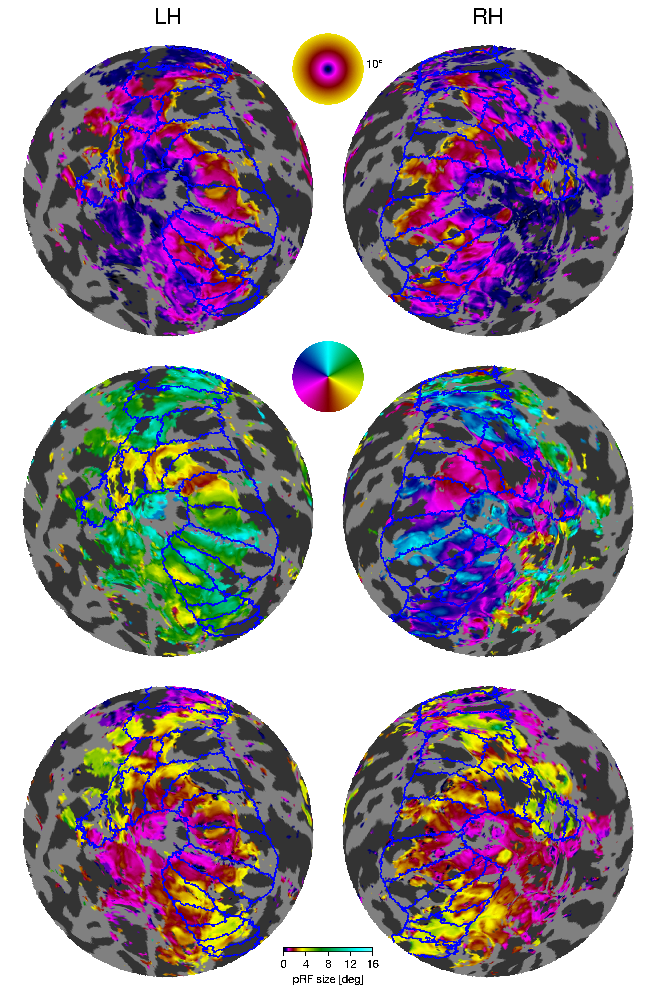

In [2]:
# Import some standard/utility libraries:
import os, sys, time, h5py, zipfile
import six           # six provides python 2/3 compatibility

# Import our numerical/scientific libraries, scipy and numpy:
import numpy as np
import scipy as sp
import gc
import seaborn as sns
# The pimms (Python Immutables) library is a utility library that enables lazy
# computation and immutble data structures; https://github.com/noahbenson/pimms
import pimms

# The neuropythy library is a swiss-army-knife for handling MRI data, especially
# anatomical/structural data such as that produced by FreeSurfer or the HCP.
import neuropythy as ny

# Import graphics libraries:
# Matplotlib/Pyplot is our 2D graphing library:
import matplotlib as mpl
import matplotlib.pyplot as plt
# We also use the 3D graphics library ipyvolume for 3D surface rendering
import ipyvolume as ipv

import matplotlib.image as image
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)

blend_cmap = mpl.colors.LinearSegmentedColormap.from_list

import scipy
# These "magic commands" tell matplotlib that we want to plot figures inline and
# That we are using qt as a backend; due to bugs in certain versions of
# matplotlib, we put them in a separate cell from the import statements above
# and the configuration statements below.
project_path = '/Users/administrator/Documents/akinetopsia' #path to BIDS directory


%matplotlib inline

# Additional matplotlib preferences:
font_data = {'family':'sans-serif',
             'sans-serif':['Helvetica Neue', 'Helvetica', 'Arial'],
             'size': 10,
             'weight': 'light'}
mpl.rc('font',**font_data)
# we want relatively high-res images, especially when saving to disk.
mpl.rcParams['figure.dpi'] = 72*2
mpl.rcParams['savefig.dpi'] = 72*4


subname = 'wlsubj140'
sesname = 'nyu3t01' #and session
load_atlas = 1;
   # The subject freesurfer directory and the kind of subject it is
subject_path = project_path + '/derivatives/freesurfer/sub-' + subname
subject_type = 'freesurfer' # where the freesurfer data are stored

    # The directory containing the pRF parameters
prf_path = project_path + '/derivatives/prfvista/sub-' + subname + '/ses-' + sesname
surf_path = project_path + '/derivatives/freesurfer/sub-' + subname + '/surf'

print(subname)

if  1:

    # how the files are named:
    prf_filename_patt = '{hemi}.{prop}.mgz' #pRF

    # the prf property names as keys, what are the {prop} taks in the file?
    # we are using the adjusted angle params that we converted from vista to neuropythy
    prf_props = {'polar_angle': 'angle_adj',
                    'eccentricity':'eccen',
                    'variance_explained' : 'vexpl',
                    'radius' : 'sigma'}

    # Load the prf parameters into a map, using the data in the above cell.
    prf_params = {}
    for hemi in ['lh','rh']:
        tmp = {}
        for (prop, fname_tag) in prf_props.items():
           
            filename = prf_filename_patt.format(hemi=hemi, prop=fname_tag)
            tmp['prf_' + prop] = ny.load(os.path.join(prf_path, filename))
         

        prf_params[hemi] = tmp

    sub = ny.freesurfer_subject(subject_path)
    lh = sub.lh.with_prop(prf_params['lh'])
    rh = sub.rh.with_prop(prf_params['rh'])
    sub = sub.copy(hemis=pimms.assoc(sub.hemis, lh=lh, rh=rh))
    flatmaps = {h: ny.to_flatmap('occipital_pole', sub.hemis[h])
                for h in ('lh', 'rh')}


    max_ecc = 10
    mask=({'and':[('prf_variance_explained', 0.05, np.inf),('prf_eccentricity', 0, max_ecc),]})
    


    # Go ahead and setup the figure and axes onto which we will plot:

    # The trace_roi function will take care of the plots (which we made
    # in an earlier cell) and also add the previous ROI traces:



    
    (fig,axs) = plt.subplots(nrows=3, ncols=2, figsize=(8, 12), dpi=500)
    fig.subplots_adjust(0,0,1,1,0,0)
    for ax in axs.flat: ax.axis('off')
    #axs[2].axis('on')
    # Plot the properties:
    ct = 0
    
    properties = ['prf_eccentricity','prf_eccentricity','prf_polar_angle','prf_polar_angle','prf_radius','prf_radius']
    hemis = ['lh','rh','lh','rh','lh','rh']
    for k in range (0,3):
            for j in range(0,2):
                hemi = sub.hemis[hemis[ct]]
                flatmap = flatmaps[hemis[ct]]
                plots = ny.cortex_plot(flatmap, axes=axs[k,j], color=properties[ct], mask = mask)
                (u,v) = flatmap.tess.indexed_edges

                if load_atlas:
                
                    atlas1 = sub.load('{}/{}.wang15_mplbl.mgz'.format(surf_path,hemis[ct],subname))
                    lbls = atlas1[flatmap.labels]
                    ii = lbls[u] != lbls[v]
                    (x,y) = np.mean(flatmap.edge_coordinates[:,:,ii], axis=0)
                    axs[k,j].plot(x, y,'.',markersize=1,color='blue')
                    axs[k,j].plot(0,0,'-',markersize=1,color='blue',label = 'Wang Atlas')

                
            
                
                #if ct == 2:
                    #axs[k,j].legend(facecolor="gray",loc='best', bbox_to_anchor=(0.68, 0.68, 0.5, 0.5))
                    
                if ct == 1 or ct == 0:
                    axs[k,j].set_title(hemis[ct].upper(),y=1.0,x=0.5,fontsize = 20)
                    
                #tr = ny.graphics.trace_roi(hemi, flatmap, ax, closed=True, plot_list=plots)
                
                ax_pa = fig.add_axes([0.44, 0.58, 0.12, 0.12])
                ax_ec = ax = fig.add_axes([0.44, 0.90, 0.12, 0.12])
                leg_pa = ny.graphics.visual_field_legend('polar_angle', pixels=582,
                                                            boundary_pixels=21)
                leg_ec = ny.graphics.visual_field_legend('log_eccentricity', pixels=582,
                                                            boundary_pixels=21, max_eccentricity=max_ecc)
                for (ax,leg) in zip([ax_pa, ax_ec], [leg_pa, leg_ec]):
                    ax.imshow(leg).set_zorder(-1)
                    ax.set_yticks([])
                    ax.set_xticks([])
                    ax.set_xlim([0,582])
                    ax.set_ylim([0,582])
                    ax.invert_yaxis()
                    for sp in ['left', 'right', 'top', 'bottom']: ax.spines[sp].set_visible(False)
                #xoffset = 39        
                #ax_ec.set_xticks([256+xoffset, 512+xoffset])
                #ax_ec.set_xticklabels(['0°', '{}°'.format(max_ecc)])
                #ax_ec.plot([256+xoffset,512+xoffset],[582,582], 'k-', lw=1)
                ax_ec.text(580,280,'{}°'.format(max_ecc))


                ax = fig.add_axes([0.43, -0.04, 0.14, 0.14*1.2])
                q = np.linspace(0,8,100)
                ax.imshow([q,q,q,q,q], cmap='radius', vmin=0, vmax=10)
                ax.set_yticks([])
                ax.set_xticks([0,25,50,75,100])
                ax.set_xticklabels([0,4,8,12,16])
                ax.set_xlabel('pRF size [deg]');
                ct = ct + 1


                
    plt.show()
    '''
    fig.savefig(os.path.join(png_path,'{}.png'.format(subname)), dpi='figure', format=None, metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None
        )
    '''

               
            

In [4]:
?ny.cortex_plot

Signature: ny.cortex_plot(mesh, *args, **opts)
Docstring:
cortex_plot(mesh) calls either cortex_plot_2D or cortex_plot_3D depending on the dimensionality
  of the given mesh, and yields the resulting graphics object. All optional arguments supported
  by each is supported by cortex plot.

The following options are accepted:
  * color (default: None) specifies the color to plot for each vertex; this argument may take a
    number of forms:
      * None, do not plot a color over the underlay (the default)
      * a matrix of RGB or RGBA values, one per vertex
      * a property vector or a string naming a property, in which case the cmap, vmin, and vmax
        arguments are used to generate colors
      * a function that, when passed a single argument, a dict of the properties of a single
        vertex, yields an RGB or RGBA list for that vertex.
  * cmap (default: 'eccenflat') specifies the colormap to use in plotting if the color
    argument provided is a property.
  * vmin (default

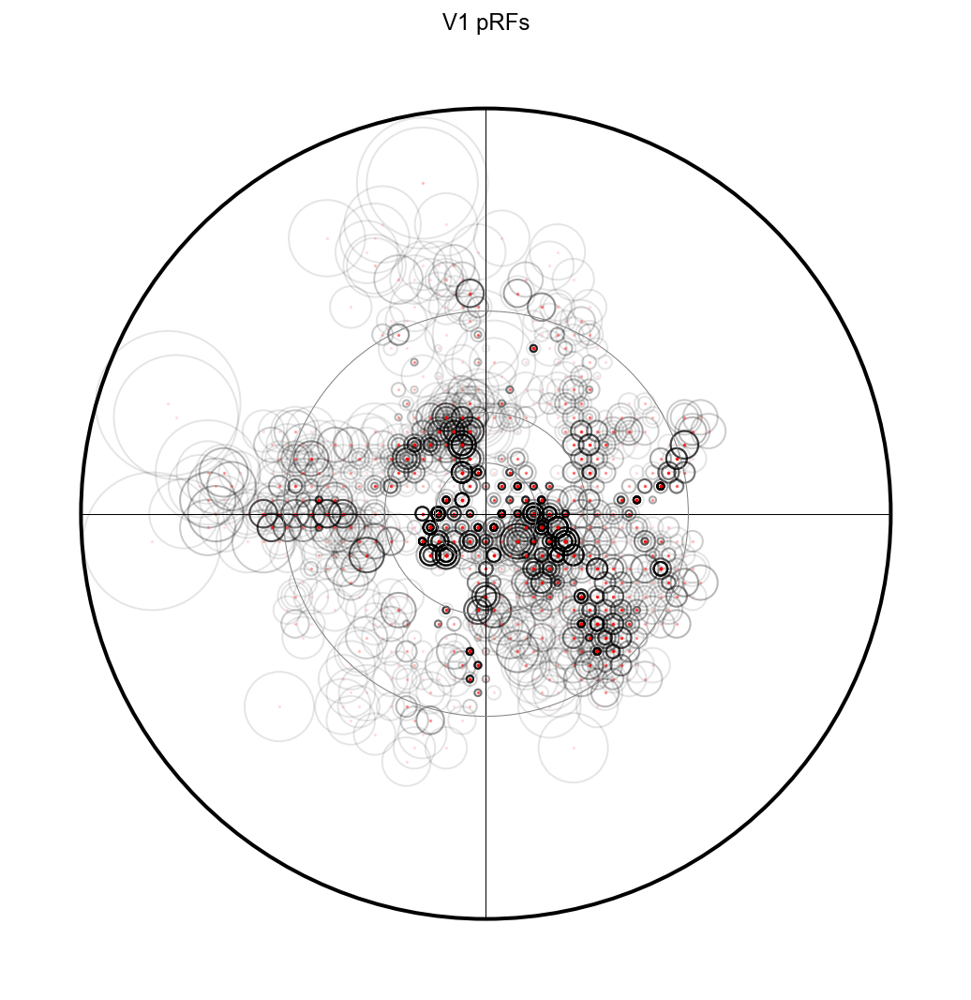

In [14]:
# Setup the figure
(fig,ax) = plt.subplots(1,1, figsize=(7,7), dpi=144)
ax.axis('off')
fig.subplots_adjust(0,0,1,1,0,0)

# Draw the visual field axes:
ax.add_patch(plt.Circle([0,0], 12, fill=True, color='white', zorder=-10))
for rad in [1.5, 3, 6]:
    circ = plt.Circle([0,0], rad, fill=False, color='gray',
                      lw=0.5, zorder=10)
    ax.add_patch(circ)
ax.plot([-12,12],[0,0], 'k-', lw=0.5)
ax.plot([0,0],[-12,12], 'k-', lw=0.5)
ax.add_patch(plt.Circle([0,0], 12, fill=False, ec='black', lw=2, zorder=10))

# Now draw all the pRFs for each hemisphere:
for h in ['lh', 'rh']:
    hemi = sub.hemis[h]
    # convert this hemisphere's prf parameters to x and y
    prf_data = ny.vision.retinotopy_data(hemi, 'prf_')
    (xs,ys) = ny.vision.as_retinotopy(prf_data, 'geographical')
    # get the sigma and variance explained
    sigs = hemi.prop('prf_radius')
    rsqs = hemi.prop('prf_variance_explained')
    # find the pRFs in V1:
    v1 = (hemi.prop('V1_weight') > 0.5) & (rsqs > 0.1)
    # plot each pRF:
    for (x, y, sig, rsq) in zip(xs[v1], ys[v1], sigs[v1], rsqs[v1]):
        disk = plt.Circle([x,y], sig/2, fill=False, fc=None, ec='black',
                          lw=None, alpha=0.1, zorder=0)
        ax.add_patch(disk)
    ax.scatter(xs[v1], ys[v1], s=0.5, c='r', alpha=0.1, zorder=1)
ax.set_title('V1 pRFs')
ax.set_xlim([-14,14])
ax.set_ylim([-14,14]);


Mesh(<3D>, <334466 faces>, <167235 vertices>)